# HDBSCAN

In [1]:
import numpy as np
import sys
sys.path.append("..")
from function.function import loadData, show_data, preprocessing, showDistribution, removenans, crossplot, Hdbscan, plotResult
from function.function import input_deleteNan, hdbscan_param, plot_cluster_distribution, crossplot_result, plot_dimensionality_reduction
from function.function import calculateAri, calculateAmi, calculateVm, plotInputData

## Load Data

In [2]:
data = np.load('../syntheticData/Model5b/output_fields_smooth.npz')

data_list = loadData(data)



## Plot Input Data

Using function show_data() to draw each parameter of input data. 

There are three parameters of show_data(), which are dataset, the number of rows and the number of columns.

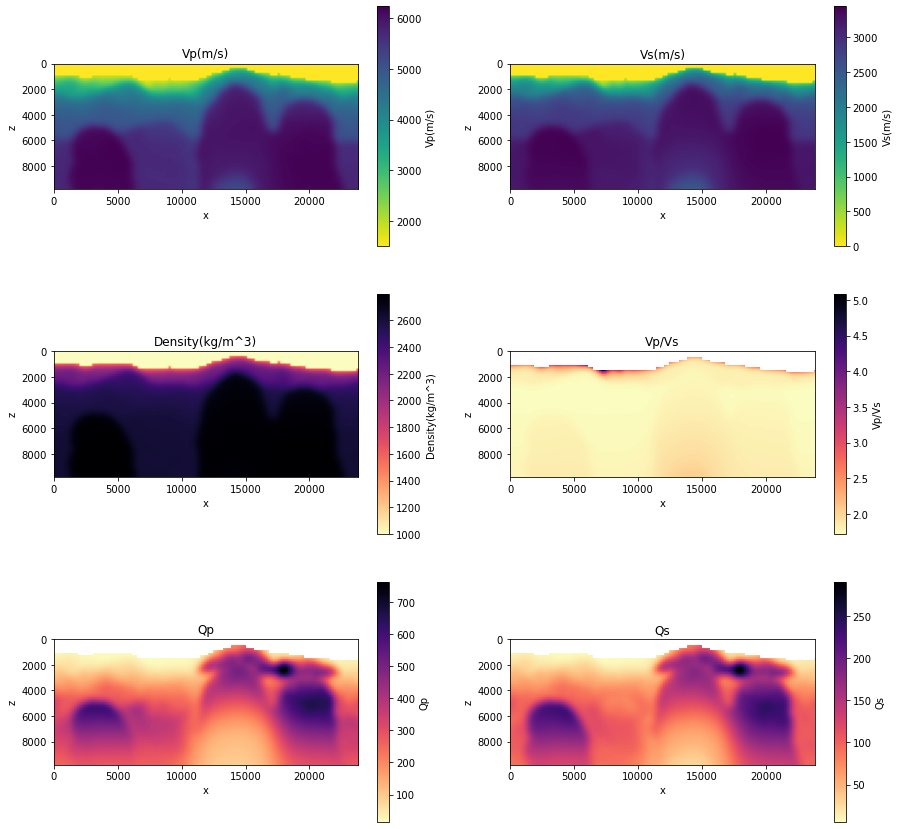

In [3]:
show_data(data_list,3,2)

Using removenans() to remove points with nan values from array. 

- new_data is the original data saved in the form of np.array.

- data_noNan removes nan values from new_data. 

- nan_list is the list of nan values index.

In [4]:
new_data,data_noNan,nan_list = removenans(data)

Using showDistribution() to show the distribution of each parameter. Since the last two parameters of new_data is 'x' and 'z', we only use new_data[:,:-2]

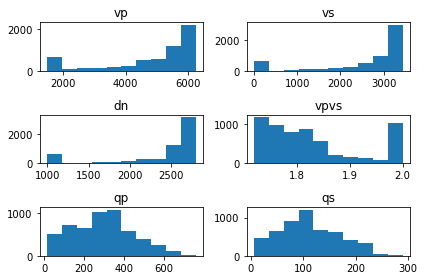

In [5]:
showDistribution(new_data[:,:-2])

Using crossplot to plot the cross-plot (scatter plot) of each pair of physical properties (other parameters and vp)

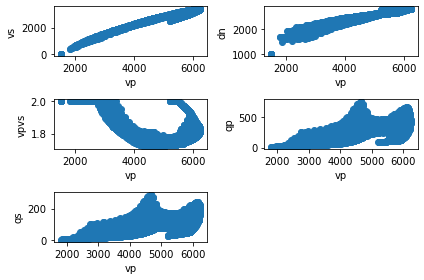

In [6]:
crossplot(new_data)

## Data Preprocessing

Using preprocessing() to make data standardized

In [7]:
# remove the mean
# divide by the variance

data_preprocessing = preprocessing(data_noNan) 


## Plot Data after Preprocessing

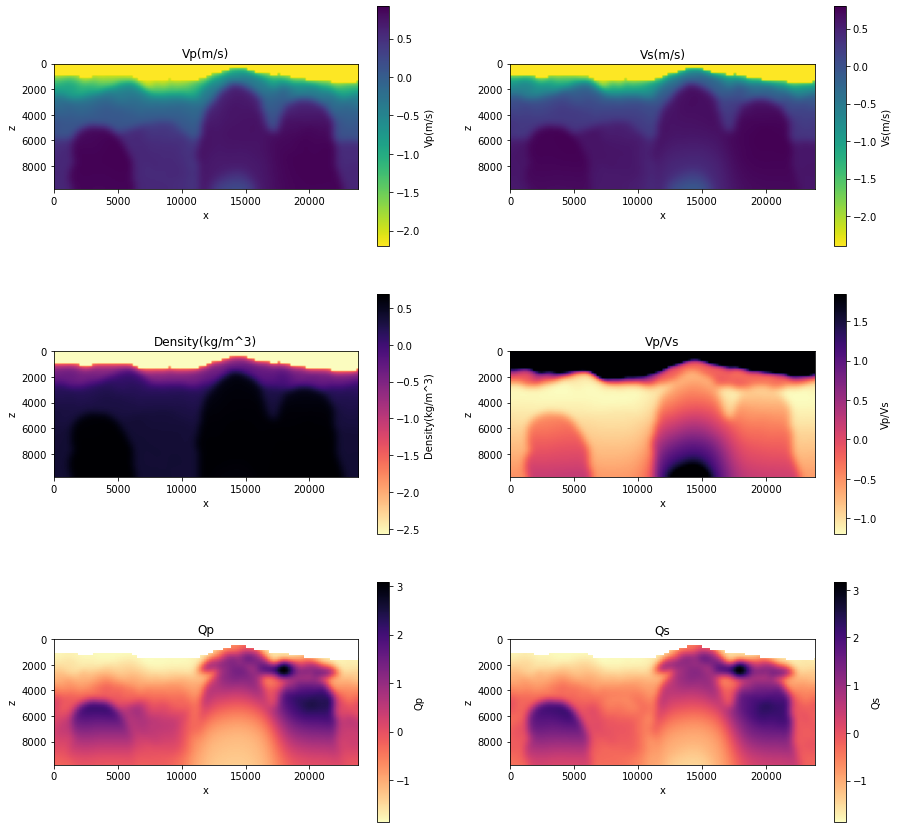

In [8]:
data_list = []
data1 = preprocessing(new_data)
for i in range(data_preprocessing.shape[1]-2):
    data_list.append(data1[:,i].reshape(50,120))
show_data(data_list,3,2)

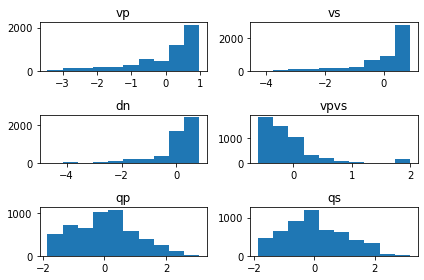

In [9]:
showDistribution(data_preprocessing[:,:-2])

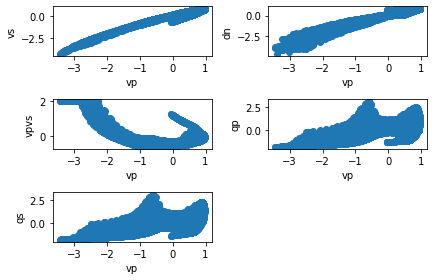

In [10]:
crossplot(data_preprocessing)

## Input Data

Loading and plotting input data.

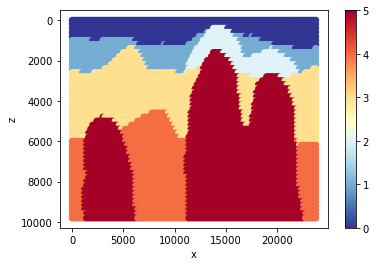

In [11]:
input_data = np.load('../syntheticData/Model5b/input_fields.npz')
plotInputData(input_data)

In [12]:
input_label = input_data['classes'].reshape(-1)
input_delete = input_deleteNan(input_label, nan_list)

## HDBSCAN

Using Hdbscan() to divide data in clusters.

- result_h is the result of Hdbscan and data_preprocessing is normalized data with no nan value
- output_h is labels for all data after Hdbscan

Using plotResult() to show the result of clusters.

- data is the original input data
- output_h is labels for all data after Hdbscan

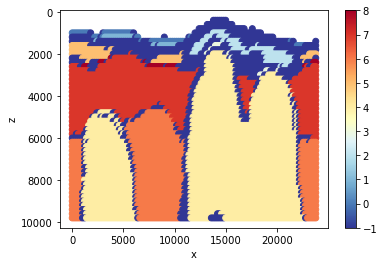

In [13]:
result_h, score_h = Hdbscan(data_preprocessing[:,:-2],min_size=10,min_sample=26)
plotResult(data_noNan,result_h)

## Tuning Parameters

Using hdbscan_param() to tuning HDBSCAN parameters

In [14]:
hdbscan_param(data_preprocessing[:,:-2])

Running grid search over hyperparameters
Validity: 0.11505333471408352, min_cluster_size: 10, min_sample_size: 1
CH score: 62.0254447467774, min_cluster_size: 10, min_sample_size: 1
Validity: 0.12688272229747288, min_cluster_size: 10, min_sample_size: 6
CH score: 101.1775871316449, min_cluster_size: 10, min_sample_size: 6
Validity: 0.21878053650511917, min_cluster_size: 10, min_sample_size: 11
CH score: 345.5932112138959, min_cluster_size: 10, min_sample_size: 11
CH score: 373.1777673590579, min_cluster_size: 10, min_sample_size: 16
Validity: 0.41909157767486055, min_cluster_size: 10, min_sample_size: 26
CH score: 696.5554229676402, min_cluster_size: 10, min_sample_size: 26
Validity: 0.43896448172981123, min_cluster_size: 10, min_sample_size: 31
CH score: 771.9581324038692, min_cluster_size: 10, min_sample_size: 31
Validity: 0.4507392420068293, min_cluster_size: 10, min_sample_size: 41
CH score: 884.2485903078218, min_cluster_size: 10, min_sample_size: 41
CH score: 998.1174038683782, m

Plotting result of best parameters.
Hdbscan() have three parameters.
- The first one is the dataset.
- The second one is the minimum size of clusters. It has default value 4.
- The third one is the minimum size of samples. It has default value 10.

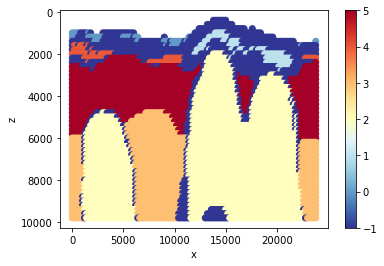

In [15]:
result_validity, score_h = Hdbscan(data_preprocessing[:,:-2],min_size=10,min_sample=56)
plotResult(data_noNan,result_validity)

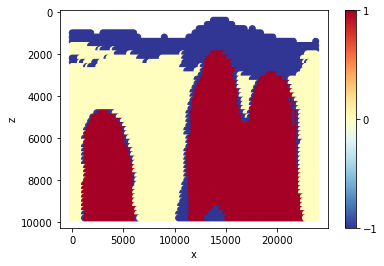

In [16]:
result_ch, score_h = Hdbscan(data_preprocessing[:,:-2],min_size=760,min_sample=51)
plotResult(data_noNan,result_ch)

## Compare HDBSCAN with Input Data

### Adjusted Rand Index

Using calculateAri() to calculate adjusted rand index for two cluster results.

#### Optimal values by validity score

In [17]:
ari_k = calculateAri(result_validity, input_delete)
print("Adjusted Rand Index of optimal validity result is ", ari_k)

Adjusted Rand Index of optimal validity result is  0.8073998338928107


#### Optimal values by CH score

In [18]:
ari_h = calculateAri(result_ch, input_delete)
print("Adjusted Rand Index of optimal CH result is ",ari_h)

Adjusted Rand Index of optimal CH result is  0.6606974922665966


### Adjusted Mutual Information

Using calculateAmi() to calculate adjusted mutual information for two cluster results.

#### Optimal values by validity score

In [19]:
ami_k = calculateAmi(result_validity, input_delete)
print("Adjusted Mutual Information of optimal validity result is ", ami_k)

Adjusted Mutual Information of optimal validity result is  0.7483052256965079


#### Optimal values by CH score

In [20]:
ami_h = calculateAmi(result_ch, input_delete)
print("Adjusted Mutual Information of optimal CH result is ", ami_h)

Adjusted Mutual Information of optimal CH result is  0.6122037525111966


### V-measure

Using calculateVm() to calculate V-measure for two cluster results.

#### Optimal values by validity score

In [21]:
vm_k = calculateVm(result_validity, input_delete)
print("V-measure of optimal validity result is ", vm_k)

V-measure of optimal validity result is  0.7487092349618868


#### Optimal values by CH score

In [22]:
vm_h = calculateVm(result_ch, input_delete)
print("V-measure of optimal CH result is ", vm_h)

V-measure of optimal CH result is  0.6124432348225035


## Choosing result of best parameters

In [23]:
result_validity, score_h = Hdbscan(data_preprocessing[:,:-2],min_size=10,min_sample=56)

## Dimensionality Reduction

Using plot_dimensionality_reduction() to plot the cluster result after dimensionality reduction.

It has two parameters:

- The first one is dataset
- The second one is cluster result

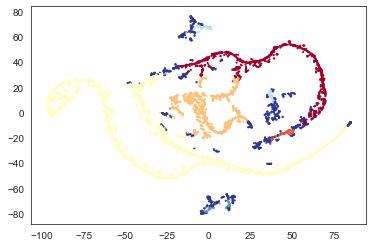

In [24]:
plot_dimensionality_reduction(data_preprocessing[:,:-2],result_validity)

## Result Crossplot

crossplot_result has two parameters.
- The first one is dataset with no nan values.
- The second one is clustering result.

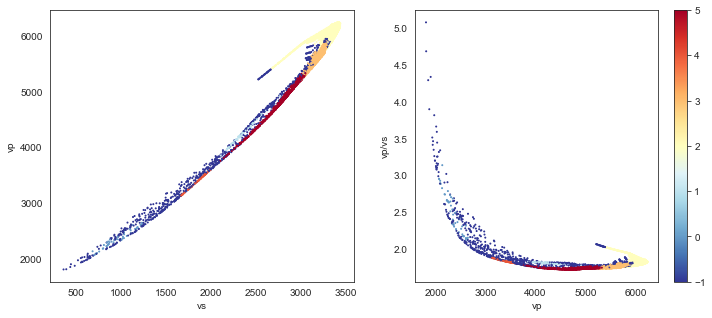

In [25]:
crossplot_result(data_noNan, result_validity)

## Cluster Distribution

Using plot_cluster_distribution() to plot the distribution of clusters.

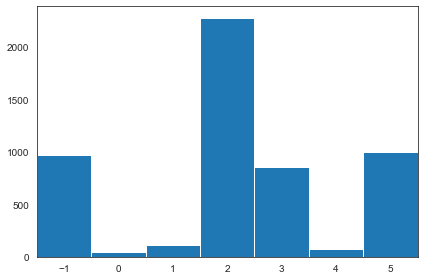

In [26]:
plot_cluster_distribution(result_validity)

## Testing with Various Input Parameters

Testing with different sets of characteristics.

Dataset has 8 characteristics called Vp, Vs, Density, Vp/Vs, Qp, Qs, x, z, and the index of them is 0, 1, 2, 3, 4, 5, 6, 7.

In [27]:
testData1 = data_preprocessing[:,[0,1,3]]
testData2 = data_preprocessing[:,[0,2,4]]
testData3 = data_preprocessing[:,[0,1]]

- testData1 selects Vp, Vs and Vp/Vs.
- testData2 selects Vp, Density and Qp.
- testData3 selectes Vp and Vs.

## Vp, Vs, Vp/Vs

### HDBSCAN

In [28]:
hdbscan_param(testData1)

Running grid search over hyperparameters
Validity: 0.14511465177752703, min_cluster_size: 10, min_sample_size: 1
CH score: 94.92662995703503, min_cluster_size: 10, min_sample_size: 1
CH score: 148.85297192738835, min_cluster_size: 10, min_sample_size: 6
CH score: 232.79796077795555, min_cluster_size: 10, min_sample_size: 11
Validity: 0.24604916955612377, min_cluster_size: 10, min_sample_size: 16
CH score: 597.3279756803438, min_cluster_size: 10, min_sample_size: 16
Validity: 0.2777574367199401, min_cluster_size: 10, min_sample_size: 21
Validity: 0.35141707385050197, min_cluster_size: 10, min_sample_size: 26
CH score: 720.3315381808204, min_cluster_size: 10, min_sample_size: 36
CH score: 1475.38083173601, min_cluster_size: 10, min_sample_size: 46
Validity: 0.3803813801488745, min_cluster_size: 10, min_sample_size: 56
Validity: 0.3820948327992265, min_cluster_size: 10, min_sample_size: 61
CH score: 2291.7019122022784, min_cluster_size: 10, min_sample_size: 66
Validity: 0.4826307637300981

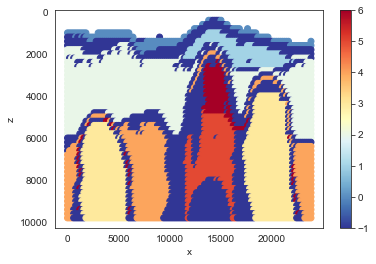

In [29]:
result_validity, score_h = Hdbscan(testData1,min_size=160,min_sample=26)
plotResult(data_noNan,result_validity)

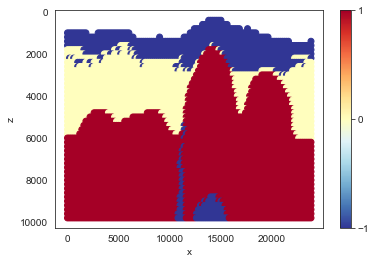

In [30]:
result_ch, score_h = Hdbscan(testData1,min_size=660,min_sample=26)
plotResult(data_noNan,result_ch)

## Compare HDBSCAN with Input Data

### Adjusted Rand Index

Using calculateAri() to calculate adjusted rand index for two cluster results.

#### Optimal values by validity score

In [31]:
ari_k = calculateAri(result_validity, input_delete)
print("Adjusted Rand Index of optimal validity result is ", ari_k)

Adjusted Rand Index of optimal validity result is  0.35981917814001335


#### Optimal values by CH score

In [32]:
ari_h = calculateAri(result_ch, input_delete)
print("Adjusted Rand Index of optimal CH result is ",ari_h)

Adjusted Rand Index of optimal CH result is  0.5419999582505596


### Adjusted Mutual Information

Using calculateAmi() to calculate adjusted mutual information for two cluster results.

#### Optimal values by validity score

In [33]:
ami_k = calculateAmi(result_validity, input_delete)
print("Adjusted Mutual Information of optimal validity result is ", ami_k)

Adjusted Mutual Information of optimal validity result is  0.5254150498944516


#### Optimal values by CH score

In [34]:
ami_h = calculateAmi(result_ch, input_delete)
print("Adjusted Mutual Information of optimal CH result is ", ami_h)

Adjusted Mutual Information of optimal CH result is  0.5823015847108561


### V-measure

Using calculateVm() to calculate V-measure for two cluster results.

#### Optimal values by validity score

In [35]:
vm_k = calculateVm(result_validity, input_delete)
print("V-measure of optimal validity result is ", vm_k)

V-measure of optimal validity result is  0.5262036853302323


#### Optimal values by CH score

In [36]:
vm_h = calculateVm(result_ch, input_delete)
print("V-measure of optimal CH result is ", vm_h)

V-measure of optimal CH result is  0.5825718586468066


## Vp, Density, Qp

### HDBSCAN

In [37]:
hdbscan_param(testData2)

Running grid search over hyperparameters
Validity: 0.13560091440807065, min_cluster_size: 10, min_sample_size: 1
CH score: 63.24146524006767, min_cluster_size: 10, min_sample_size: 1
Validity: 0.1760440235056996, min_cluster_size: 10, min_sample_size: 6
CH score: 94.31775219307825, min_cluster_size: 10, min_sample_size: 6
Validity: 0.27734515308146984, min_cluster_size: 10, min_sample_size: 11
CH score: 100.28188173530143, min_cluster_size: 10, min_sample_size: 11
CH score: 152.14460314722885, min_cluster_size: 10, min_sample_size: 16
CH score: 408.4394779474863, min_cluster_size: 10, min_sample_size: 21
CH score: 428.9833379994119, min_cluster_size: 10, min_sample_size: 36
Validity: 0.36313314105145356, min_cluster_size: 10, min_sample_size: 86
Validity: 0.41832119234438125, min_cluster_size: 10, min_sample_size: 91
CH score: 949.849147283735, min_cluster_size: 10, min_sample_size: 91
Validity: 0.4443975113798888, min_cluster_size: 60, min_sample_size: 36
CH score: 1188.3871824596674,

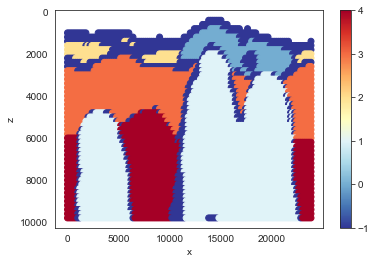

In [38]:
result_validity, score_h = Hdbscan(testData2,min_size=60,min_sample=41)
plotResult(data_noNan,result_validity)

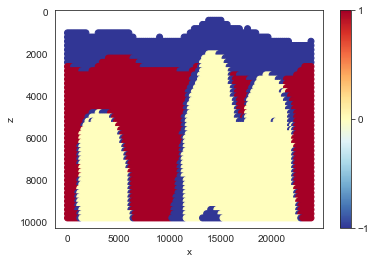

In [39]:
result_ch, score_h = Hdbscan(testData2,min_size=760,min_sample=66)
plotResult(data_noNan,result_ch)

## Compare HDBSCAN with Input Data

### Adjusted Rand Index

Using calculateAri() to calculate adjusted rand index for two cluster results.

#### Optimal values by validity score

In [40]:
ari_k = calculateAri(result_validity, input_delete)
print("Adjusted Rand Index of optimal validity result is ", ari_k)

Adjusted Rand Index of optimal validity result is  0.8106048960783944


#### Optimal values by CH score

In [41]:
ari_h = calculateAri(result_ch, input_delete)
print("Adjusted Rand Index of optimal CH result is ",ari_h)

Adjusted Rand Index of optimal CH result is  0.6634714776000414


### Adjusted Mutual Information

Using calculateAmi() to calculate adjusted mutual information for two cluster results.

#### Optimal values by validity score

In [42]:
ami_k = calculateAmi(result_validity, input_delete)
print("Adjusted Mutual Information of optimal validity result is ", ami_k)

Adjusted Mutual Information of optimal validity result is  0.7413191917118


#### Optimal values by CH score

In [43]:
ami_h = calculateAmi(result_ch, input_delete)
print("Adjusted Mutual Information of optimal CH result is ", ami_h)

Adjusted Mutual Information of optimal CH result is  0.63950316754276


### V-measure

Using calculateVm() to calculate V-measure for two cluster results.

#### Optimal values by validity score

In [44]:
vm_k = calculateVm(result_validity, input_delete)
print("V-measure of optimal validity result is ", vm_k)

V-measure of optimal validity result is  0.7416571682885793


#### Optimal values by CH score

In [45]:
vm_h = calculateVm(result_ch, input_delete)
print("V-measure of optimal CH result is ", vm_h)

V-measure of optimal CH result is  0.6397236421943284


## Vp, Vs

### HDBSCAN

In [46]:
hdbscan_param(testData3)

Running grid search over hyperparameters
Validity: 0.1464884347811072, min_cluster_size: 10, min_sample_size: 1
CH score: 111.60755716252098, min_cluster_size: 10, min_sample_size: 1
CH score: 146.29965509989384, min_cluster_size: 10, min_sample_size: 6
CH score: 248.52997915293722, min_cluster_size: 10, min_sample_size: 11
CH score: 259.49918136859685, min_cluster_size: 10, min_sample_size: 16
CH score: 283.64830914340996, min_cluster_size: 10, min_sample_size: 21
Validity: 0.3625238931936555, min_cluster_size: 10, min_sample_size: 26
CH score: 345.5372777048466, min_cluster_size: 10, min_sample_size: 26
Validity: 0.364022794182973, min_cluster_size: 10, min_sample_size: 31
CH score: 398.1030506560553, min_cluster_size: 10, min_sample_size: 31
CH score: 419.0375323857835, min_cluster_size: 10, min_sample_size: 51
CH score: 421.1557788128163, min_cluster_size: 10, min_sample_size: 56
CH score: 769.2580806271708, min_cluster_size: 10, min_sample_size: 66
Validity: 0.3663678681356651, mi

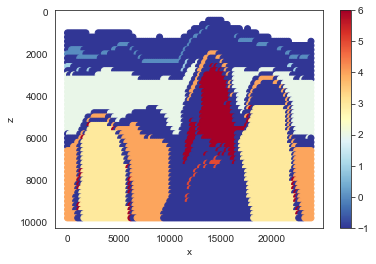

In [47]:
result_validity, score_h = Hdbscan(testData3,min_size=10,min_sample=91)
plotResult(data_noNan,result_validity)

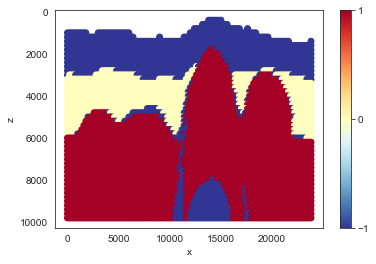

In [48]:
result_ch, score_h = Hdbscan(testData3,min_size=760,min_sample=71)
plotResult(data_noNan,result_ch)

## Compare HDBSCAN with Input Data

### Adjusted Rand Index

Using calculateAri() to calculate adjusted rand index for two cluster results.

#### Optimal values by validity score

In [49]:
ari_k = calculateAri(result_validity, input_delete)
print("Adjusted Rand Index of optimal validity result is ", ari_k)

Adjusted Rand Index of optimal validity result is  0.21799524214714588


#### Optimal values by CH score

In [50]:
ari_h = calculateAri(result_ch, input_delete)
print("Adjusted Rand Index of optimal CH result is ",ari_h)

Adjusted Rand Index of optimal CH result is  0.44934547590872553


### Adjusted Mutual Information

Using calculateAmi() to calculate adjusted mutual information for two cluster results.

#### Optimal values by validity score

In [51]:
ami_k = calculateAmi(result_validity, input_delete)
print("Adjusted Mutual Information of optimal validity result is ", ami_k)

Adjusted Mutual Information of optimal validity result is  0.43805702790741097


#### Optimal values by CH score

In [52]:
ami_h = calculateAmi(result_ch, input_delete)
print("Adjusted Mutual Information of optimal CH result is ", ami_h)

Adjusted Mutual Information of optimal CH result is  0.5083748416550844


### V-measure

Using calculateVm() to calculate V-measure for two cluster results.

#### Optimal values by validity score

In [53]:
vm_k = calculateVm(result_validity, input_delete)
print("V-measure of optimal validity result is ", vm_k)

V-measure of optimal validity result is  0.43912053851807126


#### Optimal values by CH score

In [54]:
vm_h = calculateVm(result_ch, input_delete)
print("V-measure of optimal CH result is ", vm_h)

V-measure of optimal CH result is  0.5086900855910875
